In [ ]:
import os
import random
from pathlib import Path
from collections import defaultdict

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torch.autograd import Function

import torchvision.transforms as T
import torchvision.models as models
from torchvision import transforms, datasets

from sklearn.model_selection import train_test_split
from tqdm import tqdm

from IPython.display import display
import ipywidgets as widgets

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
device = (
    torch.device("mps")
    if torch.backends.mps.is_available()
    else torch.device("cuda" if torch.cuda.is_available() else "cpu")
)
print("Using device:", device)


In [ ]:
# MOUNT THE DRIVE!!
#from google.colab import drive
#drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#data_dir = "/content/drive/MyDrive/Colab\Notebooks/data/asldata/root"

In [11]:
!ls "asldata"

Root.zip


In [ ]:
#!rm -rf data
!unzip "asldata/Root.zip" -d "data"

Archive:  asldata/Root.zip
  inflating: data/Images of American Sign Language (ASL) Alphabet Gestures/Root.zip  


In [ ]:
#suvethika
!ls "data/Images of American Sign Language (ASL) Alphabet Gestures"

Root.zip


In [15]:
#suvethika
!unzip "data/Images of American Sign Language (ASL) Alphabet Gestures/Root.zip" -d "data/asl"

Archive:  data/Images of American Sign Language (ASL) Alphabet Gestures/Root.zip
warning [data/Images of American Sign Language (ASL) Alphabet Gestures/Root.zip]:  76 extra bytes at beginning or within zipfile
  (attempting to process anyway)
error [data/Images of American Sign Language (ASL) Alphabet Gestures/Root.zip]:  reported length of central directory is
  -76 bytes too long (Atari STZip zipfile?  J.H.Holm ZIPSPLIT 1.1
  zipfile?).  Compensating...
   creating: data/asl/Root/Type_01_(Raw_Gesture)/
   creating: data/asl/Root/Type_01_(Raw_Gesture)/A/
  inflating: data/asl/Root/Type_01_(Raw_Gesture)/A/A_1.jpg  
  inflating: data/asl/Root/Type_01_(Raw_Gesture)/A/A_10.jpg  
  inflating: data/asl/Root/Type_01_(Raw_Gesture)/A/A_100.jpg  
  inflating: data/asl/Root/Type_01_(Raw_Gesture)/A/A_1000.jpg  
  inflating: data/asl/Root/Type_01_(Raw_Gesture)/A/A_1001.jpg  
  inflating: data/asl/Root/Type_01_(Raw_Gesture)/A/A_1002.jpg  
  inflating: data/asl/Root/Type_01_(Raw_Gesture)/A/A_1003.jp

# DATA PROCESSING
### See data_process.ipynb

# CLASSIFIER
### Run Baseline: a resnet18 classifier 

In [10]:
# CLASSIFIER USING RESNET-18

In [ ]:
# see if CSV_PATH = "data/asl_all_with_skin_tones.csv" exists
CSV_PATH = "data/asl_all_with_skin_tones.csv"
print("Exists?", os.path.exists(CSV_PATH))

df_all_skin = pd.read_csv(CSV_PATH)
print(df_all_skin.head())
print(df_all_skin["skin_tone_final"].value_counts())


Exists? True
                 filepath letter  skin_tone_id_pred skin_tone_pred  \
0   data/train/A/A_63.jpg      A                  1         medium   
1  data/train/A/A_823.jpg      A                  0          light   
2  data/train/A/A_837.jpg      A                  0          light   
3   data/train/A/A_77.jpg      A                  1         medium   
4  data/train/A/A_189.jpg      A                  1         medium   

  skin_tone_manual  skin_tone_id_manual skin_tone_final  skin_tone_id_final  
0              NaN                  NaN          medium                 1.0  
1              NaN                  NaN           light                 0.0  
2              NaN                  NaN           light                 0.0  
3              NaN                  NaN          medium                 1.0  
4              NaN                  NaN          medium                 1.0  
skin_tone_final
light     15296
medium    14820
dark      11884
Name: count, dtype: int64


In [ ]:
CSV_PATH = "data/asl_all_with_skin_tones.csv"  # adjust if needed

df = pd.read_csv(CSV_PATH)

# We only need these columns for baseline
df = df[["filepath", "letter"]].dropna()

# Make sure paths exist - sanity check
df = df[df["filepath"].apply(os.path.exists)]
print("Total images after path check:", len(df))

# Map letters to integer IDs
letters = sorted(df["letter"].unique())
letter_to_id = {letter: idx for idx, letter in enumerate(letters)}
id_to_letter = {v: k for k, v in letter_to_id.items()}

df["label_id"] = df["letter"].map(letter_to_id)

print("Num classes:", len(letters))
print("Classes:", letters)
#expected output: Total images: 42000, Num classes: 28, Classes: ['A', 'B', 'C', ..., 'Z']

Total images after path check: 42000
Num classes: 28
Classes: ['A', 'B', 'C', 'D', 'DEL', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'SPACE', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


In [ ]:
# =========================================================
# Task 1 - BASELINE MODEL, classifier using resnet18
# =========================================================

DATA_CSV = "data/asl_all_with_skin_tones.csv"
BASELINE_BEST_MODEL = "asl_resnet18_baseline_best.pth"
df = pd.read_csv(DATA_CSV)

# We only need image paths + letter labels for baseline
df = df[["filepath", "letter"]].dropna()

# Filter out any rows where the file doesn't exist (just in case)
df = df[df["filepath"].apply(os.path.exists)]
print("Total images after path check:", len(df))

# Map letters to integer class IDs
letters = sorted(df["letter"].unique())
letter_to_id = {letter: idx for idx, letter in enumerate(letters)}
id_to_letter = {v: k for k, v in letter_to_id.items()}

df["label_id"] = df["letter"].map(letter_to_id)

print("Num classes:", len(letters))
print("Classes:", letters)

Total images after path check: 42000
Num classes: 28
Classes: ['A', 'B', 'C', 'D', 'DEL', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'SPACE', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


In [ ]:
train_df, val_df = train_test_split(
    df,
    test_size=0.2,
    stratify=df["label_id"],
    random_state=42,
)

len(train_df), len(val_df) # expected output: (33600, 8400)

(33600, 8400)

### ASLAlphabetDataset Class

In [31]:
train_transform = T.Compose([
    T.Resize((256, 256)),
    T.RandomResizedCrop(224, scale=(0.8, 1.0)),
    # Avoid horizontal flips because ASL orientation matters
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

val_transform = T.Compose([
    T.Resize((256, 256)),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

class ASLAlphabetDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row["filepath"]).convert("RGB")
        if self.transform is not None:
            img = self.transform(img)
        label = int(row["label_id"])
        return img, label


In [ ]:
batch_size = 64 # keep small for MPS, keep num_workers=0

train_ds = ASLAlphabetDataset(train_df, transform=train_transform)
val_ds   = ASLAlphabetDataset(val_df,   transform=val_transform)

train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True,
                          num_workers=0, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False,
                          num_workers=0, pin_memory=True)


In [33]:
num_classes = len(letters)

model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, num_classes)

model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


In [34]:
def train_one_epoch(model, loader, optimizer, criterion, epoch):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    loop = tqdm(loader, desc=f"Epoch {epoch} [train]", leave=False)
    for images, labels in loop:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, preds = outputs.max(1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

        loop.set_postfix(loss=loss.item())

    avg_loss = running_loss / total
    acc = correct / total
    return avg_loss, acc

def eval_model(model, loader, criterion, epoch):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        loop = tqdm(loader, desc=f"Epoch {epoch} [val]", leave=False)
        for images, labels in loop:
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = outputs.max(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    avg_loss = running_loss / total
    acc = correct / total
    return avg_loss, acc


In [ ]:
num_epochs = 8
best_val_acc = 0.0

for epoch in range(1, num_epochs + 1):
    train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion, epoch)
    val_loss, val_acc = eval_model(model, val_loader, criterion, epoch)

    print(f"Epoch {epoch:02d}: "
          f"train_loss={train_loss:.4f}, train_acc={train_acc:.3f} | "
          f"val_loss={val_loss:.4f}, val_acc={val_acc:.3f}")

    # Save best model to Drive
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), BASELINE_BEST_MODEL)
        print(f"New best model saved with val_acc={val_acc:.3f} to {BASELINE_BEST_MODEL}")

print("Best val acc:", best_val_acc)


Epoch 1 [train]:   0%|          | 0/525 [00:00<?, ?it/s]/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/torch/utils/data/dataloader.py:692: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch 01: train_loss=0.3274, train_acc=0.931 | val_loss=0.0172, val_acc=0.998
  🔥 New best model saved with val_acc=0.998 to asl_resnet18_baseline_best.pth


Epoch 02: train_loss=0.0126, train_acc=0.999 | val_loss=0.0106, val_acc=0.998


Epoch 03: train_loss=0.0097, train_acc=0.998 | val_loss=0.0101, val_acc=0.998


Epoch 04: train_loss=0.0042, train_acc=1.000 | val_loss=0.0059, val_acc=0.999
  🔥 New best model saved with val_acc=0.999 to asl_resnet18_baseline_best.pth


Epoch 05: train_loss=0.0116, train_acc=0.998 | val_loss=0.0038, val_acc=1.000
  🔥 New best model saved with val_acc=1.000 to asl_resnet18_baseline_best.pth


Epoch 06: train_loss=0.0061, train_acc=0.999 | val_loss=0.0026, val_acc=1.000
  🔥 New best model saved with val_acc=1.000 to asl_resnet18_baseline_best.pth


Epoch 07: train_loss=0.0010, train_acc=1.000 | val_loss=0.0026, val_acc=1.000


Epoch 08: train_loss=0.0153, train_acc=0.996 | val_loss=0.0032, val_acc=1.000
Best val acc: 0.9996428571428572


In [36]:
best_model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
best_model.fc = nn.Linear(best_model.fc.in_features, num_classes)
best_model.load_state_dict(torch.load(BASELINE_BEST_MODEL, map_location=device))
best_model = best_model.to(device)
best_model.eval()

def evaluate_overall_accuracy(model, loader):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, preds = outputs.max(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    return correct / total

final_val_acc = evaluate_overall_accuracy(best_model, val_loader)
print(f"Final baseline ResNet-18 validation accuracy: {final_val_acc*100:.2f}%")


Final baseline ResNet-18 validation accuracy: 99.96%


# GRAD-CAM VIZ FOR BASELINE

In [12]:
CSV_PATH = "data/asl_all_with_skin_tones.csv"
BASELINE_MODEL_PATH = "asl_resnet18_baseline_best.pth"

In [13]:
df = pd.read_csv(CSV_PATH)

# Keep only rows that exist on disk
df = df[df["filepath"].apply(os.path.exists)].reset_index(drop=True)

# Drop rows without letter or skin tone
df = df.dropna(subset=["letter", "skin_tone_final"]).reset_index(drop=True)

letters = sorted(df["letter"].unique())
letter_to_id = {letter: idx for idx, letter in enumerate(letters)}
id_to_letter = {v: k for k, v in letter_to_id.items()}

df["label_id"] = df["letter"].map(letter_to_id)

print("Num classes:", len(letters))
print("Classes:", letters[:10], "...")
print(df["skin_tone_final"].value_counts())


Num classes: 28
Classes: ['A', 'B', 'C', 'D', 'DEL', 'E', 'F', 'G', 'H', 'I'] ...
skin_tone_final
light     15296
medium    14820
dark      11884
Name: count, dtype: int64


In [14]:
train_df, val_df = train_test_split(
    df,
    test_size=0.2,
    stratify=df["label_id"],
    random_state=42,
)

len(train_df), len(val_df)


(33600, 8400)

In [15]:
num_classes = len(letters)

model = models.resnet18(weights=None)
model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load(BASELINE_MODEL_PATH, map_location=device))
model = model.to(device)
model.eval()


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [16]:
val_transform = T.Compose([
    T.Resize((256, 256)),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])


In [17]:
###### GRAD CAM HELPER FUNCTIONS ######
def visualize_gradcam_for_row(row, model, device, target_layers):
    img_path = row["filepath"]
    true_label_id = int(row["label_id"])
    true_letter = row["letter"]
    skin_tone = row["skin_tone_final"]

    # Load PIL image
    pil_img = Image.open(img_path).convert("RGB")

    # For overlay: make a 224x224 float [0,1] version
    pil_resized = pil_img.resize((224, 224))
    rgb_img = np.float32(pil_resized) / 255.0

    # For model: val_transform
    input_tensor = val_transform(pil_img).unsqueeze(0).to(device)

    # Forward once to get predicted class
    with torch.no_grad():
        outputs = model(input_tensor)
        pred_id = outputs.argmax(dim=1).item()
        pred_letter = id_to_letter[pred_id]

    # Use Grad-CAM targeting the predicted class
    cam = GradCAM(model=model, target_layers=target_layers)

    targets = [ClassifierOutputTarget(pred_id)]
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]  # [H,W] for first image

    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    # Plot
    plt.figure(figsize=(6,3))
    plt.subplot(1,2,1)
    plt.imshow(pil_resized)
    plt.axis("off")
    plt.title(f"Orig | true={true_letter}\nskin={skin_tone}")

    plt.subplot(1,2,2)
    plt.imshow(visualization)
    plt.axis("off")
    plt.title(f"Grad-CAM | pred={pred_letter}")
    plt.tight_layout()
    plt.show()

    return true_letter, pred_letter

def compute_hand_focus_for_row(row, model, device, target_layers):
    img_path = row["filepath"]
    true_label_id = int(row["label_id"])

    # Load image
    pil_img = Image.open(img_path).convert("RGB")

    # Prep for model
    input_tensor = val_transform(pil_img).unsqueeze(0).to(device)

    # Make sure model can backprop
    model.eval()
    for p in model.parameters():
        p.requires_grad_(True)

    # Forward
    outputs = model(input_tensor)
    pred_id = outputs.argmax(dim=1).item()

    # Option: only consider correctly classified examples
    if pred_id != true_label_id:
        return None  # skip misclassified

    targets = [ClassifierOutputTarget(pred_id)]
    cam = GradCAM(model=model, target_layers=target_layers)

    # grayscale_cam: [1, H, W] -> take [0]
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]  # H x W

    # Normalize CAM to positive values
    cam_map = grayscale_cam.astype(np.float32)
    cam_map = np.maximum(cam_map, 0)
    total = cam_map.sum() + 1e-6  # avoid divide-by-zero

    H, W = cam_map.shape

    # Define "hand region" as central 50% of the image
    y0, y1 = int(0.25 * H), int(0.75 * H)
    x0, x1 = int(0.25 * W), int(0.75 * W)
    hand_region = cam_map[y0:y1, x0:x1]

    hand_sum = hand_region.sum()
    hand_focus_score = hand_sum / total

    return hand_focus_score

def sample_rows_by_skin_tone(val_df, skin_tone, n=3, seed=0):
    random.seed(seed)
    subset = val_df[val_df["skin_tone_final"] == skin_tone].copy()
    subset = subset.sample(min(n * 5, len(subset)), random_state=seed)  # oversample, we’ll filter by correctness
    return subset.reset_index(drop=True)


In [18]:
target_layers = [model.layer4[-1]]


=========== Skin tone: light ===========


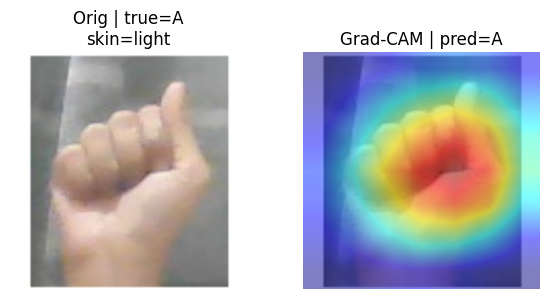

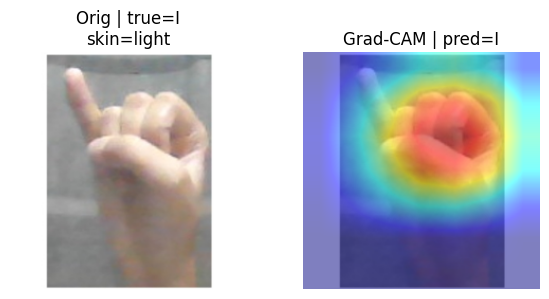

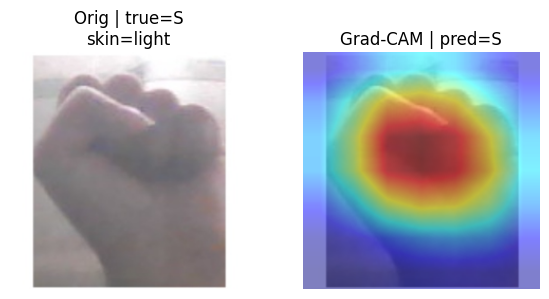


=========== Skin tone: medium ===========


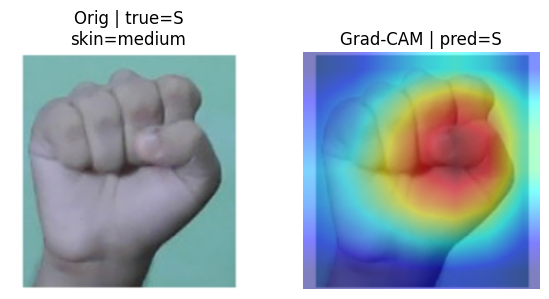

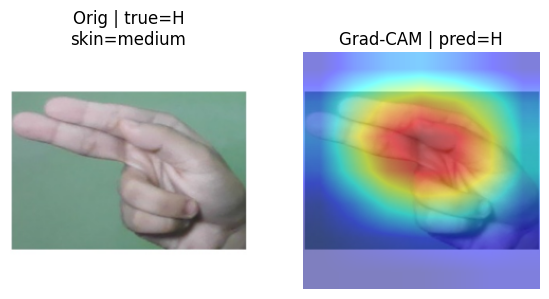

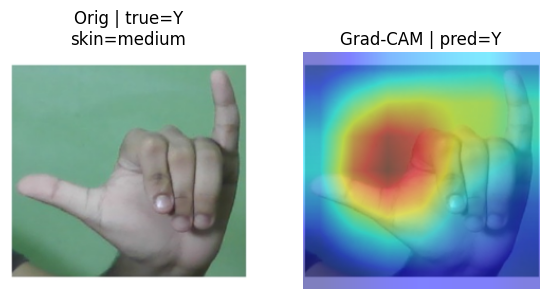


=========== Skin tone: dark ===========


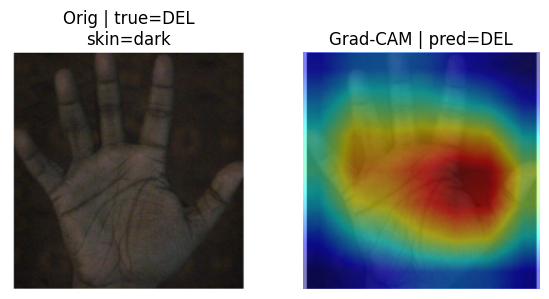

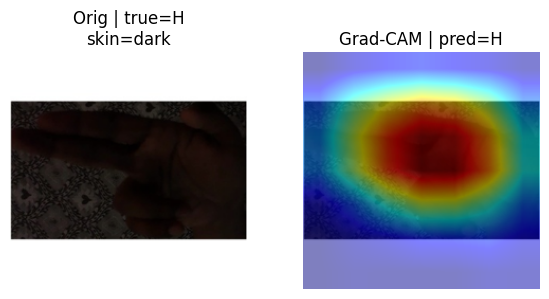

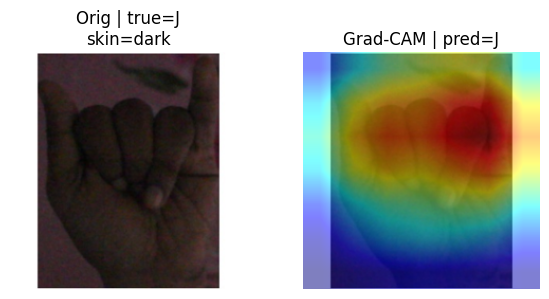

In [ ]:
tones = ["light", "medium", "dark"]
N_PER_TONE = 3

for tone in tones:
    print(f"\n=========== Skin tone: {tone} ===========")
    candidates = sample_rows_by_skin_tone(val_df, tone, n=N_PER_TONE, seed=42)

    shown = 0
    for i, row in candidates.iterrows():
        if shown >= N_PER_TONE:
            break
        true_letter, pred_letter = visualize_gradcam_for_row(row, model, device, target_layers)
        if true_letter == pred_letter:
            shown += 1


In [ ]:
tones = ["light", "medium", "dark"]
scores_by_tone = {}

MAX_IMAGES_PER_TONE = 50  # you can increase if it's fast

for tone in tones:
    print(f"\n=== Processing tone: {tone} ===")
    subset = val_df[val_df["skin_tone_final"] == tone].copy()
    subset = subset.sample(min(len(subset), MAX_IMAGES_PER_TONE * 3), random_state=42)
    subset = subset.reset_index(drop=True)

    tone_scores = []
    for i, row in subset.iterrows():
        if len(tone_scores) >= MAX_IMAGES_PER_TONE:
            break
        score = compute_hand_focus_for_row(row, model, device, target_layers)
        if score is not None:
            tone_scores.append(score)
            if len(tone_scores) % 10 == 0:
                print(f"  Collected {len(tone_scores)} scores for {tone}...")

    scores_by_tone[tone] = tone_scores
    print(f"Collected {len(tone_scores)} valid scores for tone={tone}")



=== Processing tone: light ===
  Collected 10 scores for light...
  Collected 20 scores for light...
  Collected 30 scores for light...
  Collected 40 scores for light...
  Collected 50 scores for light...
Collected 50 valid scores for tone=light

=== Processing tone: medium ===
  Collected 10 scores for medium...
  Collected 20 scores for medium...
  Collected 30 scores for medium...
  Collected 40 scores for medium...
  Collected 50 scores for medium...
Collected 50 valid scores for tone=medium

=== Processing tone: dark ===
  Collected 10 scores for dark...
  Collected 20 scores for dark...
  Collected 30 scores for dark...
  Collected 40 scores for dark...
  Collected 50 scores for dark...
Collected 50 valid scores for tone=dark


In [ ]:
for tone in tones:
    scores = scores_by_tone.get(tone, [])
    if not scores:
        print(f"{tone}: no scores")
        continue
    arr = np.array(scores)
    print(f"{tone}: n={len(arr)}, mean={arr.mean():.3f}, std={arr.std():.3f}, "
          f"min={arr.min():.3f}, max={arr.max():.3f}")


light: n=50, mean=0.488, std=0.044, min=0.377, max=0.570
medium: n=50, mean=0.446, std=0.046, min=0.323, max=0.550
dark: n=50, mean=0.466, std=0.051, min=0.352, max=0.552


/var/folders/y5/6dthtbv90w90hmtzvsl2s0lc0000gn/T/ipykernel_3297/3053396459.py:5: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=labels)


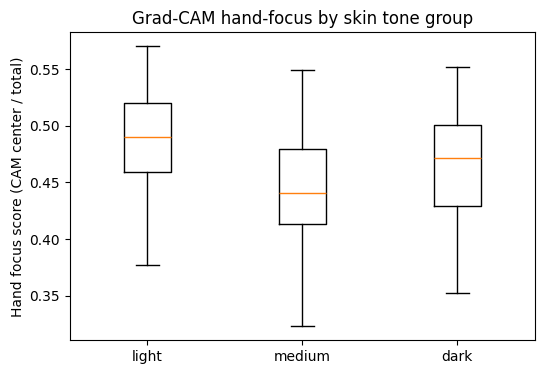

In [52]:
data = [scores_by_tone[t] for t in tones if len(scores_by_tone[t]) > 0]
labels = [t for t in tones if len(scores_by_tone[t]) > 0]

plt.figure(figsize=(6,4))
plt.boxplot(data, labels=labels)
plt.ylabel("Hand focus score (CAM center / total)")
plt.title("Grad-CAM hand-focus by skin tone group")
plt.show()


In [38]:
class ASLValDataset(Dataset):
    def __init__(self, df, transform):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row["filepath"]).convert("RGB")
        img = self.transform(img)
        
        label = int(row["label_id"])
        skin = row["skin_tone_final"]     
        skin_id = self.skin_to_id[skin]    
    
        return img, label, skin_id         

val_dataset = ASLValDataset(val_df, val_transform)
val_loader2 = DataLoader(val_dataset, batch_size=64, shuffle=False)

In [ ]:
def accuracy_by_group(model, loader):
    model.eval()

    correct = defaultdict(int)
    total = defaultdict(int)

    with torch.no_grad():
        for images, labels, skin_tones in loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            preds = outputs.argmax(1)

            matches = (preds == labels).cpu().numpy()

            for match, tone in zip(matches, skin_tones):
                total[tone] += 1
                if match:
                    correct[tone] += 1

    # compute accuracy
    acc = {tone: correct[tone] / total[tone] for tone in total}
    return acc, correct, total

group_acc, correct_counts, total_counts = accuracy_by_group(model, val_loader2)
group_acc


KeyboardInterrupt: 

# END BASELINE

# Adversarial Debiasing for ASL Classification with Gradient Reversal Layer

In [20]:
csv_path = "asl_all_with_skin_tones.csv"
df = pd.read_csv(csv_path)
print(df.head())


                 filepath letter  skin_tone_id_pred skin_tone_pred  \
0   data/train/A/A_63.jpg      A                  1         medium   
1  data/train/A/A_823.jpg      A                  0          light   
2  data/train/A/A_837.jpg      A                  0          light   
3   data/train/A/A_77.jpg      A                  1         medium   
4  data/train/A/A_189.jpg      A                  1         medium   

  skin_tone_manual  skin_tone_id_manual skin_tone_final  skin_tone_id_final  
0              NaN                  NaN          medium                 1.0  
1              NaN                  NaN           light                 0.0  
2              NaN                  NaN           light                 0.0  
3              NaN                  NaN          medium                 1.0  
4              NaN                  NaN          medium                 1.0  


In [21]:
# Fixing paths in csv to match my laptop's directory structure
df = pd.read_csv("asl_all_with_skin_tones.csv")

# Base directory where images now live
base = Path("data/asl/Root/Type_01_(Raw_Gesture)")

# Fix filepaths
def fix_path(row):
    letter = row["letter"]
    filename = Path(row["filepath"]).name   # e.g., A_63.jpg
    new_path = base / letter / filename
    return str(new_path)

df["filepath"] = df.apply(fix_path, axis=1)

df.head()

,filepath,letter,skin_tone_id_pred,skin_tone_pred,skin_tone_manual,skin_tone_id_manual,skin_tone_final,skin_tone_id_final
0,data/asl/Root/Type_01_(Raw_Gesture)/A/A_63.jpg,A,1,medium,NaN,NaN,medium,1.0
1,data/asl/Root/Type_01_(Raw_Gesture)/A/A_823.jpg,A,0,light,NaN,NaN,light,0.0
2,data/asl/Root/Type_01_(Raw_Gesture)/A/A_837.jpg,A,0,light,NaN,NaN,light,0.0
3,data/asl/Root/Type_01_(Raw_Gesture)/A/A_77.jpg,A,1,medium,NaN,NaN,medium,1.0
4,data/asl/Root/Type_01_(Raw_Gesture)/A/A_189.jpg,A,1,medium,NaN,NaN,medium,1.0


(np.float64(-0.5), np.float64(299.5), np.float64(299.5), np.float64(-0.5))

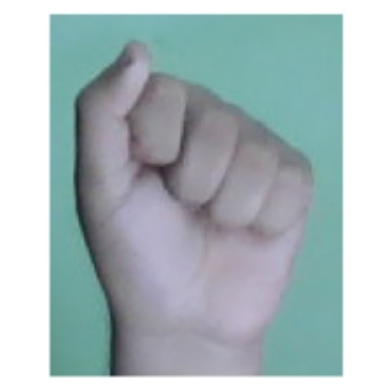

In [22]:
# test displaying an image
test_path = "data//root/Type_01_(Raw_Gesture)/A/A_63.jpg"
img = Image.open(test_path)
plt.imshow(img)
plt.axis("off")

In [23]:
# split into train/val/test sets (70/15/15 stratified by letter)

train_df, temp_df = train_test_split(
    df, test_size=0.30, random_state=42, stratify=df["letter"]
)
val_df, test_df = train_test_split(
    temp_df, test_size=0.50, random_state=42, stratify=temp_df["letter"]
)

print(len(train_df), len(val_df), len(test_df))

train_df.to_csv("train.csv", index=False)
val_df.to_csv("val.csv", index=False)
test_df.to_csv("test.csv", index=False) #29400, 6300, 6300


29400 6300 6300


In [24]:
train_df.head()

,filepath,letter,skin_tone_id_pred,skin_tone_pred,skin_tone_manual,skin_tone_id_manual,skin_tone_final,skin_tone_id_final
10097,data/asl/Root/Type_01_(Raw_Gesture)/F/F_819.jpg,F,0,light,NaN,NaN,light,0.0
30001,data/asl/Root/Type_01_(Raw_Gesture)/SPACE/SPAC...,SPACE,2,dark,NaN,NaN,dark,2.0
24659,data/asl/Root/Type_01_(Raw_Gesture)/P/P_709.jpg,P,0,light,NaN,NaN,light,0.0
25934,data/asl/Root/Type_01_(Raw_Gesture)/Q/Q_65.jpg,Q,1,medium,NaN,NaN,medium,1.0
21092,data/asl/Root/Type_01_(Raw_Gesture)/N/N_247.jpg,N,1,medium,NaN,NaN,medium,1.0


In [25]:
############ DATASET & LOADERS ############
class ASLDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row["filepath"]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        label = int(row["label_id"])
        skin = int(row["skin_tone_id_final"])
        return img, label, skin

# label_id mapping
letters = sorted(df['letter'].unique())
letter_to_id = {letter: idx for idx, letter in enumerate(letters)}
id_to_letter = {idx: letter for letter, idx in letter_to_id.items()}
df['label_id'] = df['letter'].map(letter_to_id)

# train/val/test split
train_val_df, test_df = train_test_split(
    df, test_size=0.1, stratify=df['label_id'], random_state=42
)
train_df, val_df = train_test_split(
    train_val_df, test_size=0.2, stratify=train_val_df['label_id'], random_state=42
)

# transforms (use same as baseline if possible)
transform = T.Compose([
    T.Resize((256, 256)),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
])

train_dataset = ASLDataset(train_df, transform)
val_dataset   = ASLDataset(val_df, transform)
test_dataset  = ASLDataset(test_df, transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_dataset,   batch_size=32, shuffle=False, num_workers=0)
test_loader  = DataLoader(test_dataset,  batch_size=32, shuffle=False, num_workers=0)


In [26]:
############ MODEL ############

class GradientReversalFunction(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):
        return grad_output.neg() * ctx.alpha, None

class GradientReversalLayer(nn.Module):
    def __init__(self, alpha=1.0):
        super().__init__()
        self.alpha = alpha

    def forward(self, x):
        return GradientReversalFunction.apply(x, self.alpha)

class ASLResNet18Debiased(nn.Module):
    def __init__(self, num_letters, num_skin_tones, alpha=0.1):
        super().__init__()
        self.backbone = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()
        
        self.asl_head = nn.Linear(in_features, num_letters)
        self.grl = GradientReversalLayer(alpha=alpha)
        self.skin_head = nn.Linear(in_features, num_skin_tones)

    def forward(self, x):
        features = self.backbone(x)
        asl_logits = self.asl_head(features)
        skin_logits = self.skin_head(self.grl(features))
        return asl_logits, skin_logits

device = torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu")
print("Using device:", device)

model = ASLResNet18Debiased(num_letters=len(letters), num_skin_tones=3, alpha=0.1).to(device)

criterion_asl  = nn.CrossEntropyLoss()
criterion_skin = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


Using device: mps


In [27]:
############ TRAIN / VAL LOOPS ############

def train_one_epoch(model, train_loader, optimizer, criterion_asl, criterion_skin,
                    device, skin_loss_weight=0.1):

    model.train()
    
    total_asl_loss = 0.0
    total_skin_loss = 0.0
    total_asl_correct = 0
    total_skin_correct = 0
    total_samples = 0
    total_batches = 0

    for images, labels, skin in train_loader:
        images = images.to(device)
        labels = labels.to(device)
        skin   = skin.to(device)

        optimizer.zero_grad()
        
        asl_logits, skin_logits = model(images)
        
        asl_loss  = criterion_asl(asl_logits, labels)
        skin_loss = criterion_skin(skin_logits, skin)
        
        total_loss = asl_loss + skin_loss_weight * skin_loss
        total_loss.backward()
        optimizer.step()
        
        total_asl_loss  += asl_loss.item()
        total_skin_loss += skin_loss.item()
        
        _, asl_preds  = torch.max(asl_logits, 1)
        _, skin_preds = torch.max(skin_logits, 1)
        
        total_asl_correct  += (asl_preds == labels).sum().item()
        total_skin_correct += (skin_preds == skin).sum().item()
        total_samples += labels.size(0)
        total_batches += 1

    avg_asl_loss  = total_asl_loss / total_batches
    avg_skin_loss = total_skin_loss / total_batches
    asl_acc  = total_asl_correct  / total_samples
    skin_acc = total_skin_correct / total_samples

    print(f"Train ASL loss:  {avg_asl_loss:.4f}, acc: {asl_acc*100:.2f}%")
    print(f"Train Skin loss: {avg_skin_loss:.4f}, acc: {skin_acc*100:.2f}%")

def validate_one_epoch(model, val_loader, criterion_asl, criterion_skin, device):
    model.eval()

    total_asl_loss = 0.0
    total_skin_loss = 0.0
    total_asl_correct = 0
    total_skin_correct = 0
    total_samples = 0
    total_batches = 0

    with torch.no_grad():
        for images, labels, skin in val_loader:
            images = images.to(device)
            labels = labels.to(device)
            skin   = skin.to(device)

            asl_logits, skin_logits = model(images)

            asl_loss  = criterion_asl(asl_logits, labels)
            skin_loss = criterion_skin(skin_logits, skin)

            total_asl_loss  += asl_loss.item()
            total_skin_loss += skin_loss.item()
            total_batches   += 1

            _, asl_preds  = torch.max(asl_logits, 1)
            _, skin_preds = torch.max(skin_logits, 1)

            total_asl_correct  += (asl_preds == labels).sum().item()
            total_skin_correct += (skin_preds == skin).sum().item()
            total_samples += labels.size(0)

    avg_asl_loss  = total_asl_loss / total_batches
    avg_skin_loss = total_skin_loss / total_batches
    asl_acc  = total_asl_correct  / total_samples
    skin_acc = total_skin_correct / total_samples

    print("\n----- Validation -----")
    print(f"Val ASL loss:  {avg_asl_loss:.4f}, acc: {asl_acc*100:.2f}%")
    print(f"Val Skin loss: {avg_skin_loss:.4f}, acc: {skin_acc*100:.2f}%")
    print("----------------------\n")

    return asl_acc

In [28]:
BEST_PATH = "asl_debiased_best.pth"
best_val_acc = 0.0
num_epochs = 5

for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    train_one_epoch(model, train_loader, optimizer,
                    criterion_asl, criterion_skin, device,
                    skin_loss_weight=0.1)
    val_acc = validate_one_epoch(model, val_loader,
                                 criterion_asl, criterion_skin, device)
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), BEST_PATH)
        print(f"Saved BEST model (Val ASL Accuracy: {best_val_acc*100:.2f}%)")

Epoch 1/5
Train ASL loss:  0.2566, acc: 94.60%
Train Skin loss: 1.3218, acc: 19.18%

----- Validation -----
Val ASL loss:  0.0126, acc: 99.72%
Val Skin loss: 1.3901, acc: 13.56%
----------------------

Saved BEST model (Val ASL Accuracy: 99.72%)
Epoch 2/5
Train ASL loss:  0.0081, acc: 99.93%
Train Skin loss: 1.1770, acc: 27.06%

----- Validation -----
Val ASL loss:  0.0028, acc: 99.92%
Val Skin loss: 1.1262, acc: 32.26%
----------------------

Saved BEST model (Val ASL Accuracy: 99.92%)
Epoch 3/5
Train ASL loss:  0.0176, acc: 99.61%
Train Skin loss: 1.1114, acc: 34.28%

----- Validation -----
Val ASL loss:  0.0037, acc: 99.87%
Val Skin loss: 1.1115, acc: 33.16%
----------------------

Epoch 4/5
Train ASL loss:  0.0134, acc: 99.75%
Train Skin loss: 1.1035, acc: 36.61%

----- Validation -----
Val ASL loss:  0.0052, acc: 99.88%
Val Skin loss: 1.0772, acc: 38.62%
----------------------

Epoch 5/5
Train ASL loss:  0.0102, acc: 99.79%
Train Skin loss: 1.0949, acc: 36.53%

----- Validation --

# END DEBIASED

# COMPARE BASELINE AND DEBIASED

In [ ]:
num_letters = len(letters)                 # 28
num_skin_tones = df["skin_tone_final"].nunique()  # 3

# --- Baseline model ---
baseline_model = models.resnet18(weights=None)
baseline_model.fc = nn.Linear(baseline_model.fc.in_features, num_letters)
baseline_state = torch.load("asl_resnet18_baseline_best.pth", map_location=device)
baseline_model.load_state_dict(baseline_state)
baseline_model = baseline_model.to(device).eval()

# --- Debiased model ---
debiased_model = ASLResNet18Debiased(
    num_letters=num_letters,
    num_skin_tones=num_skin_tones,
    alpha=0.1      # same as training
).to(device)

state_dict = torch.load("asl_debiased_best.pth", map_location=device)
debiased_model.load_state_dict(state_dict)
debiased_model.eval()

ASLResNet18Debiased(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=Tr

In [48]:
def sign_accuracy_by_skin_tone(model, loader, device):
    model.eval()
    correct = defaultdict(int)
    total   = defaultdict(int)

    with torch.no_grad():
        for images, labels, skin_ids in loader:
            images = images.to(device)
            labels = labels.to(device)

            out = model(images)

            # Handle baseline vs debiased
            if isinstance(out, tuple):
                asl_logits = out[0]       # we ONLY care about ASL
            else:
                asl_logits = out

            preds = asl_logits.argmax(dim=1)

            matches = (preds == labels).cpu().numpy()
            skin_ids_np = skin_ids.numpy()

            for ok, sid in zip(matches, skin_ids_np):
                tone_name = id_to_skin[int(sid)]   # <-- map 0/1/2 -> "dark"/"light"/"medium"
                total[tone_name] += 1
                if ok:
                    correct[tone_name] += 1

    acc = {tone: correct[tone] / total[tone] for tone in total}
    return acc, correct, total



In [ ]:
class ASLValDataset(Dataset):
    def __init__(self, df, transform, skin_to_id):
        self.df = df.reset_index(drop=True)
        self.transform = transform
        self.skin_to_id = skin_to_id   

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row["filepath"]).convert("RGB")
        img = self.transform(img)

        label = int(row["label_id"])
        skin = row["skin_tone_final"]
        skin_id = self.skin_to_id[skin]

        return img, label, skin_id


In [45]:
tones = sorted(df["skin_tone_final"].unique())
skin_to_id = {t:i for i,t in enumerate(tones)}
id_to_skin = {v:k for k,v in skin_to_id.items()}

In [46]:
val_dataset = ASLValDataset(val_df, val_transform, skin_to_id)
val_loader2 = DataLoader(val_dataset, batch_size=64, shuffle=False)


In [49]:
# Baseline (your ResNet18)
base_acc, base_correct, base_total = sign_accuracy_by_skin_tone(
    baseline_model,  # baseline resnet18
    val_loader2,
    device
)

print("Baseline SIGN accuracy by skin tone:")
for tone in sorted(base_acc.keys()):
    print(f"{tone:6s}: {base_acc[tone]*100:.2f}%  ({base_correct[tone]}/{base_total[tone]})")

# Debiased (GRL model)
deb_acc, deb_correct, deb_total = sign_accuracy_by_skin_tone(
    debiased_model,
    val_loader2,
    device
)

print("\nDebiased SIGN accuracy by skin tone:")
for tone in sorted(deb_acc.keys()):
    print(f"{tone:6s}: {deb_acc[tone]*100:.2f}%  ({deb_correct[tone]}/{deb_total[tone]})")


Baseline SIGN accuracy by skin tone:
dark  : 100.00%  (2114/2114)
light : 100.00%  (2760/2760)
medium: 100.00%  (2686/2686)

Debiased SIGN accuracy by skin tone:
dark  : 99.95%  (2113/2114)
light : 99.82%  (2755/2760)
medium: 100.00%  (2686/2686)


In [50]:
def skin_accuracy(model, loader, device):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels, skin_ids in loader:
            images = images.to(device)
            skin_ids = skin_ids.to(device)
            _, skin_logits = model(images)
            preds = skin_logits.argmax(1)
            correct += (preds == skin_ids).sum().item()
            total += skin_ids.size(0)
    return correct / total


In [55]:
from sklearn.metrics import confusion_matrix
import numpy as np

all_true = []
all_pred = []

with torch.no_grad():
    for images, labels, skin_ids in val_loader2:
        images = images.to(device)
        _, skin_logits = debiased_model(images)
        preds = skin_logits.argmax(1).cpu().numpy()
        all_pred.extend(preds)
        all_true.extend(skin_ids.numpy())

cm = confusion_matrix(all_true, all_pred)
cm


array([[1454,  659,    1],
       [2115,  473,  172],
       [2357,  323,    6]])

### UNUSED CODE - EITHER FOR BUILDING DATA DIRECTORY OR NOT IN USE

In [ ]:
"""import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm

cv2.setNumThreads(2)

# use another model to auto classify as light/medium/dark skin tone
# ------------ CONFIG -------------
TRAIN_ROOT = "/content/drive/MyDrive/notebooks/data/asldata/root/train"
   # your ASL alphabet train dir
CROP_RATIO = 0.7                    # how much of the center area to use
CSV_OUT = "/content/drive/MyDrive/asl_with_skin_groups.csv"
# ---------------

def compute_skin_score(img, crop_ratio=CROP_RATIO):
    """
    Compute a 'skin score' from a center crop, focusing on skin pixels
    using a simple YCrCb skin mask. Returns a scalar score.
    """

    h, w = img.shape[:2]
    ch, cw = int(h * crop_ratio), int(w * crop_ratio)
    y0 = (h - ch) // 2
    x0 = (w - cw) // 2
    crop = img[y0:y0+ch, x0:x0+cw]

    # --- Convert to YCrCb for skin mask ---
    ycrcb = cv2.cvtColor(crop, cv2.COLOR_BGR2YCrCb)
    Y, Cr, Cb = cv2.split(ycrcb)

    # Classic approximate skin thresholds in YCrCb
    # (These are rough and can be tuned.)
    lower = np.array([0, 133, 77], dtype=np.uint8)
    upper = np.array([255, 173, 127], dtype=np.uint8)
    mask = cv2.inRange(ycrcb, lower, upper)

    # If we found enough skin pixels, compute lightness only on them
    num_skin_pixels = np.count_nonzero(mask)

    if num_skin_pixels > 50:  # require at least some pixels
        # Convert to LAB to get 'L' channel (lightness)
        lab = cv2.cvtColor(crop, cv2.COLOR_BGR2LAB)
        L, A, B = cv2.split(lab)

        skin_L = L[mask > 0]
        skin_score = float(np.median(skin_L))
    else:
        # Fallback: use median L over entire crop
        lab = cv2.cvtColor(crop, cv2.COLOR_BGR2LAB)
        L, A, B = cv2.split(lab)
        skin_score = float(np.median(L))

    return skin_score


def build_csv(train_root=TRAIN_ROOT, csv_out=CSV_OUT, max_images=None):
    rows = []

    # 1) Gather paths
    all_paths = []
    for label in sorted(os.listdir(train_root)):
        label_dir = os.path.join(train_root, label)
        if not os.path.isdir(label_dir):
            continue
        for fname in os.listdir(label_dir):
            if fname.lower().endswith(".jpg"):
                all_paths.append((label, os.path.join(label_dir, fname)))

    if max_images is not None:
        all_paths = all_paths[:max_images]
        print(f"Running in TEST MODE with max_images={max_images}")

    print("Total images to process:", len(all_paths))

    # 2) Process with progress bar
    for label, fpath in tqdm(all_paths, desc="Processing images", unit="img"):
        img = cv2.imread(fpath)
        if img is None:
            continue

        skin_score = compute_skin_score(img)
        rows.append({"filepath": fpath, "label": label, "skin_score": skin_score})

    df = pd.DataFrame(rows)
    print(f"Computed skin scores for {len(df)} images.")

    if len(df) == 0:
        df.to_csv(csv_out, index=False)
        print("No images processed; saved empty CSV.")
        return df

    # 3) Assign groups.
    # If you *really* want 3 groups (even if same person), keep quantiles:
    q1, q2 = np.quantile(df["skin_score"], [1/3, 2/3])

    def assign_group(s):
        if s <= q1:
            return "light"
        elif s <= q2:
            return "medium"
        else:
            return "dark"

    df["skin_tone_group"] = df["skin_score"].apply(assign_group)
    df["skin_tone_id"] = df["skin_tone_group"].map({"light": 0, "medium": 1, "dark": 2})

    df.to_csv(csv_out, index=False)
    print(f"Saved CSV to {csv_out}")
    return df"""


In [ ]:
"""def print_samples_per_letter(csv_path="asl_with_skin_groups.csv", examples_per_letter=3):
    df = pd.read_csv(csv_path)
    for label in sorted(df["label"].unique()):
        subset = df[df["label"] == label].head(examples_per_letter)
        print(f"\n===== LETTER: {label} =====")
        for _, row in subset.iterrows():
            print(
                f"{row['filepath']} → score={row['skin_score']:.1f}, group={row['skin_tone_group']}"
            )

print_samples_per_letter()"""

In [ ]:
"""def show_samples_per_letter(csv_path="asl_with_skin_groups.csv",
                            examples_per_letter=3,
                            figsize=(12, 4)):
    """
    Display a few example images per ASL letter along with
    their assigned skin-tone group and skin_score.
    """

    df = pd.read_csv(csv_path)

    # sort letters alphabetically for predictable ordering
    labels = sorted(df["label"].unique())

    for label in labels:
        subset = df[df["label"] == label].head(examples_per_letter)
        if len(subset) == 0:
            continue

        # Create a figure for this letter
        plt.figure(figsize=(figsize[0], figsize[1]))

        plt.suptitle(f"Letter: {label}", fontsize=16)

        for i, (_, row) in enumerate(subset.iterrows(), start=1):
            img = Image.open(row["filepath"]).convert("RGB")

            plt.subplot(1, examples_per_letter, i)
            plt.imshow(img)
            plt.axis("off")
            plt.title(
                f"{row['skin_tone_group']}\nscore={row['skin_score']:.1f}",
                fontsize=10
            )

        plt.tight_layout()
        plt.show()"""


In [ ]:
"""def extract_lab_feature(img, crop_ratio=CROP_RATIO):
    """Return (L_mean, a_mean, b_mean) for a center crop."""
    h, w = img.shape[:2]
    ch, cw = int(h * crop_ratio), int(w * crop_ratio)
    y0 = (h - ch) // 2
    x0 = (w - cw) // 2
    crop = img[y0:y0+ch, x0:x0+cw]

    lab = cv2.cvtColor(crop, cv2.COLOR_BGR2LAB)
    L, A, B = cv2.split(lab)

    return float(L.mean()), float(A.mean()), float(B.mean())


def collect_features(train_root=TRAIN_ROOT, max_images=None):
    rows = []
    features = []

    all_paths = []
    for label in sorted(os.listdir(train_root)):
        label_dir = os.path.join(train_root, label)
        if not os.path.isdir(label_dir):
            continue
        for fname in os.listdir(label_dir):
            if fname.lower().endswith(".jpg"):
                all_paths.append((label, os.path.join(label_dir, fname)))

    if max_images is not None:
        all_paths = all_paths[:max_images]
        print(f"Running feature extraction on max_images={max_images}")

    print("Total images to process:", len(all_paths))

    for label, fpath in tqdm(all_paths, desc="Extracting LAB features", unit="img"):
        img = cv2.imread(fpath)
        if img is None:
            continue
        Lm, Am, Bm = extract_lab_feature(img)
        rows.append({"filepath": fpath, "label": label,
                     "L_mean": Lm, "A_mean": Am, "B_mean": Bm})
        features.append([Lm, Am, Bm])

    df = pd.DataFrame(rows)
    feats = np.array(features)
    print("Got features for", len(df), "images.")
    return df, feats"""

In [ ]:
"""from sklearn.cluster import KMeans

def cluster_skin_tones(df, features, n_clusters=3, random_state=42):
    """
    Cluster images in LAB feature space into n_clusters.
    Returns updated df with a 'cluster' column.
    """
    print("Clustering into", n_clusters, "groups...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state, n_init=10)
    labels = kmeans.fit_predict(features)

    df = df.copy()
    df["cluster_id"] = labels
    return df, kmeans

df_clustered, kmeans_model = cluster_skin_tones(df_feats, X_feats, n_clusters=3)
print(df_clustered["cluster_id"].value_counts())"""

In [ ]:
"""import matplotlib.pyplot as plt
from PIL import Image

def show_samples_per_cluster(df, cluster_id, examples=6):
    subset = df[df["cluster_id"] == cluster_id].head(examples)
    if len(subset) == 0:
        print("No images in cluster", cluster_id)
        return

    plt.figure(figsize=(12, 4))
    plt.suptitle(f"Cluster {cluster_id}", fontsize=16)

    for i, (_, row) in enumerate(subset.iterrows(), start=1):
        img = Image.open(row["filepath"]).convert("RGB")
        plt.subplot(1, examples, i)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"L={row['L_mean']:.1f}")

    plt.tight_layout()
    plt.show()

# Show a few samples for each cluster
for cid in sorted(df_clustered["cluster_id"].unique()):
    show_samples_per_cluster(df_clustered, cid, examples=6)
"""

In [ ]:
"""# Example mapping after visual inspection
cluster_to_group = {
    1: "light",
    0: "medium",
    2: "dark",
}

df_clustered["skin_tone_group"] = df_clustered["cluster_id"].map(cluster_to_group)
df_clustered["skin_tone_id"] = df_clustered["skin_tone_group"].map(
    {"light": 0, "medium": 1, "dark": 2}
)

df_clustered.to_csv("asl_with_skin_clusters.csv", index=False)
print(df_clustered[["filepath", "label", "cluster_id", "skin_tone_group"]].head())
"""

In [ ]:
"""def show_samples_per_letter_with_skin(csv_path="asl_with_skin_clusters.csv",
                                      examples_per_letter=3):
    df = pd.read_csv(csv_path)
    labels = sorted(df["label"].unique())

    for label in labels:
        subset = df[df["label"] == label].head(examples_per_letter)
        if len(subset) == 0:
            continue

        plt.figure(figsize=(4 * examples_per_letter, 4))
        plt.suptitle(f"Letter: {label}", fontsize=16)

        for i, (_, row) in enumerate(subset.iterrows(), start=1):
            img = Image.open(row["filepath"]).convert("RGB")
            plt.subplot(1, examples_per_letter, i)
            plt.imshow(img)
            plt.axis("off")
            plt.title(
                f"{row['skin_tone_group']}\nL={row['L_mean']:.1f}",
                fontsize=10,
            )

        plt.tight_layout()
        plt.show()

# Usage:
show_samples_per_letter_with_skin("asl_with_skin_clusters.csv", examples_per_letter=3)"""


In [ ]:
"""import os
import random
import pandas as pd

# CHANGE THIS if you're not using the local copy
TRAIN_ROOT = "/content/drive/MyDrive/notebooks/data/asldata/root/train"  # or "/content/drive/MyDrive/Colab Notebooks/data/asldata/root/train"
SAMPLES_PER_LETTER = 10            # e.g. 10 images per letter

def make_sample_df(train_root=TRAIN_ROOT, samples_per_letter=SAMPLES_PER_LETTER, seed=42):
    random.seed(seed)
    rows = []

    for letter in sorted(os.listdir(train_root)):
        label_dir = os.path.join(train_root, letter)
        if not os.path.isdir(label_dir):
            continue

        # collect all .jpgs for this letter
        imgs = [
            os.path.join(label_dir, fname)
            for fname in os.listdir(label_dir)
            if fname.lower().endswith(".jpg")
        ]
        if not imgs:
            continue

        n = min(samples_per_letter, len(imgs))
        sampled_paths = random.sample(imgs, n)

        for path in sampled_paths:
            rows.append({
                "filepath": path,
                "letter": letter,
                "skin_tone": None,   # to be filled: light/medium/dark
            })

    df = pd.DataFrame(rows)
    # shuffle overall order so you don't do all A’s then all B’s, etc.
    df = df.sample(frac=1, random_state=seed).reset_index(drop=True)
    return df

df_labels = make_sample_df()
df_labels.head()"""


In [ ]:
"""

# =========================================================
# LOAD / SAMPLE IMAGES
# =========================================================
TRAIN_ROOT = "/content/drive/MyDrive/notebooks/data/asldata/root/train"   # change if needed
SAMPLES_PER_LETTER = 10
CSV_PATH = "/content/drive/MyDrive/asl_manual_labels.csv"

def make_sample_df(train_root=TRAIN_ROOT, samples_per_letter=SAMPLES_PER_LETTER, seed=42):
    random.seed(seed)
    rows = []

    for letter in sorted(os.listdir(train_root)):
        letter_dir = os.path.join(train_root, letter)
        if not os.path.isdir(letter_dir):
            continue

        imgs = [
            os.path.join(letter_dir, f)
            for f in os.listdir(letter_dir)
            if f.lower().endswith(".jpg")
        ]
        if len(imgs) == 0:
            continue

        chosen = random.sample(imgs, min(samples_per_letter, len(imgs)))
        for path in chosen:
            rows.append({"filepath": path, "letter": letter, "skin_tone": None})

    df = pd.DataFrame(rows)
    df = df.sample(frac=1, random_state=seed).reset_index(drop=True)
    return df

df = make_sample_df()

# If restarting, load previous labels
if os.path.exists(CSV_PATH):
    old = pd.read_csv(CSV_PATH)
    df.set_index("filepath", inplace=True)
    old.set_index("filepath", inplace=True)
    df.update(old[["skin_tone"]])
    df.reset_index(inplace=True)
else:
    df.to_csv(CSV_PATH, index=False)

index = 0

# =========================================================
# FUNCTIONS FOR DISPLAYING AND LABELING
# =========================================================
def show_image(i):
    """Render the image at index i."""
    plt.figure(figsize=(3, 3))
    img = Image.open(df.iloc[i].filepath)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Index {i} | Letter: {df.iloc[i].letter}")
    plt.show()

def save_and_next(skin_tone=None):
    """Save result and move to next image."""
    global index

    if skin_tone is not None:
        df.at[index, "skin_tone"] = skin_tone

        # Save incrementally
        df.to_csv(CSV_PATH, index=False)
        print(f"Saved: index={index} → {skin_tone}")

    index += 1

    if index >= len(df):
        print("🎉 All images labeled!")
        return

    show_image(index)


# =========================================================
# BUTTON UI
# =========================================================
btn_light = widgets.Button(description="Light", button_style="info")
btn_medium = widgets.Button(description="Medium", button_style="warning")
btn_dark = widgets.Button(description="Dark", button_style="danger")
btn_skip = widgets.Button(description="Skip (no label)")
btn_quit = widgets.Button(description="Quit / Stop")

def on_light(_): save_and_next("light")
def on_medium(_): save_and_next("medium")
def on_dark(_): save_and_next("dark")
def on_skip(_): save_and_next(None)
def on_quit(_): print("Stopped labeling.")

btn_light.on_click(on_light)
btn_medium.on_click(on_medium)
btn_dark.on_click(on_dark)
btn_skip.on_click(on_skip)
btn_quit.on_click(on_quit)

ui = widgets.HBox([btn_light, btn_medium, btn_dark, btn_skip, btn_quit])

# Display UI + the first image
display(ui)
show_image(index)"""
